In [1]:
import os
print(os.getcwd())
import sys  
sys.path.insert(0, '/Users/franci/MasterThesis/multiomics-perturbation/new_model')
from src_trainer.mmvae_model import MMVAE_model
import warnings

/Users/franci/MasterThesis/multiomics-perturbation/new_model/notebooks/Training scenario 1


Global seed set to 0


## Import model

In [4]:
my_model = MMVAE_model.load("../../input/{}_{}".format('MMVAE', '20220522-190512'))

{'func': 'train_model', 'dataset_path': '../data/czi_data.h5ad', 'model_type': 'MMVAE', 'cat_cov_keys': ['annotation_L1', 'group', 'condition'], 'test_split': None, 'ood_condition': None, 'train_size': 0.8, 'subset_data': None, 'subset_PG': None, 'subset_AD': None, 'n_hvg': 5000, 'seed': 0, 'hparams': {'vae_n_hidden': 128, 'vae_n_latent': 20, 'vae_n_layers': 2, 'vae_dropout': 0.1, 'vae_lr': 0.0001, 'vae_wd': 1e-06, 'batch_size': 128, 'gene_likelihood': 'nb'}, 'max_epochs': 400, 'check_val_every_n_epoch': 20, 'save_dir': '..', 'save_model': True, 'save_anndata': True, 'sweep_seeds': 200, 'model_name': '20220522-190512'}
Encode covariates: True, Cat_cov: [8, 3, 2]
My VAE
My Encoder
My Encoder


In [5]:
print(my_model._model_summary_string)

TotalVI Model with the following params: 
n_latent: 20, n_hidden 128, n_layers: 2, gene_likelihood: nb, dropout_rate: 0.1. 
Training conditions: 
Categorical covariates: ['annotation_L1', 'group', 'condition'], Subset data: None (on PG: None and ADJ: None).


## Loss evaluation

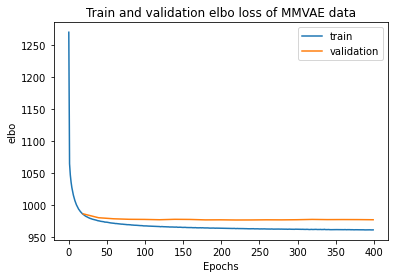

Minimal elbo train value: elbo_train    961.71814
Name: 399, dtype: object and val value: elbo_validation    977.518005
Name: 399, dtype: object


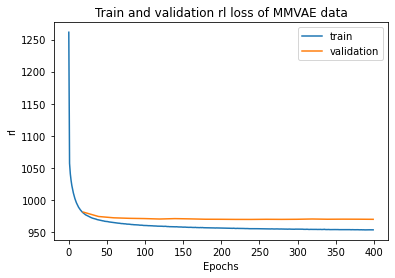

Minimal reconstruction_loss train value: reconstruction_loss_train    953.504211
Name: 399, dtype: object and val value: reconstruction_loss_validation    969.911926
Name: 399, dtype: object


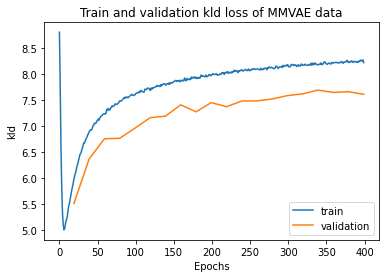

Minimal kl_local train value: kl_local_train    8.214446
Name: 399, dtype: object and val value: kl_local_validation    7.606226
Name: 399, dtype: object


In [6]:
from src_trainer.plotting import plot_single_value, plot_train_val

args_elbo = {'var': "elbo",
             'var_label': "elbo",
             'ylim': None,
             'modality': my_model.args['model_type']
             }
args_rl = {'var': "reconstruction_loss",
           'var_label': "rl",
           'ylim': None,
           'modality': my_model.args['model_type']
           }
args_kld = {'var': "kl_local",
            'var_label': "kld",
            'ylim': None,
            'modality': my_model.args['model_type']
            }

list_args = [args_elbo, args_rl, args_kld]

for plot_args in list_args:
    if my_model.args['check_val_every_n_epoch'] is not None:
        plot_train_val(my_model, plot_args=plot_args, pdf=None)
    else:
        plot_single_value(my_model, plot_args, 'train')
    print("Minimal {} train value: {} and val value: {}".format(
        plot_args['var'], 
        my_model.history['{}_train'.format(plot_args['var'])].iloc[-1],
        my_model.history['{}_validation'.format(plot_args['var'])].iloc[-1],
    ))

# Evaluation reconstructions

In [8]:
from src_trainer.plotting import boxplot_corr, scatterplot_corr
import pickle

cond_dict = {'group': 'LD',
             'annotation_L1': None,
             'condition': 'PI'}

marker_dict = {'CD4T': [['CD3D', 'CD4'], ['CD3_ADT', 'CD4_ADT']],
                'B': [['MS4A1', 'CD19', 'CD79A'], ['CD19_ADT', 'CD20_ADT']],
                'Monocyte': [['S100A9', 'CD14'], ['CD14_ADT', 'CD16_ADT']]}

col_conds = [{'PG': 'LD', 'ADJ': 'medium'}, 
             {'PG': 'DK', 'ADJ': 'medium'},
             {'PG': 'RT', 'ADJ': 'medium'},
             {'PG': 'LD', 'ADJ': 'PI'},
             {'PG': 'DK', 'ADJ': 'PI'},
             {'PG': 'RT', 'ADJ': 'PI'}]


#all_markers = my_model.adata.var_names
#data = my_model.adata.copy()

## Spearman correlations

### Posterior sampling

DK_B_PI


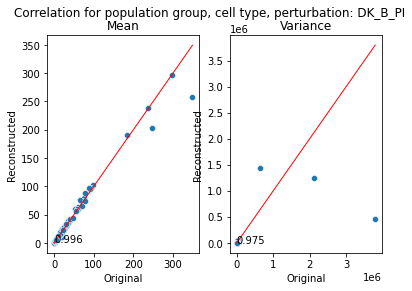

DK_B_medium


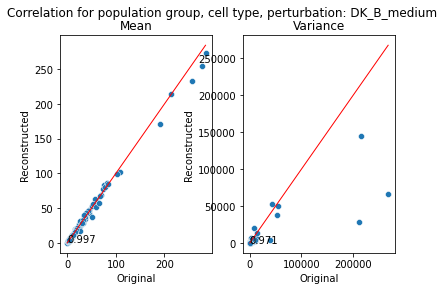

DK_CD4T_PI


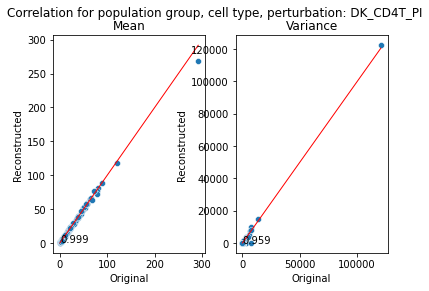

DK_CD4T_medium


KeyboardInterrupt: 

In [9]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    filename = '../../results/y_pred/{}_{}_{}_{}.pickle'.format(my_model.args['model_type'], my_model.args['model_name'],
                                                     'posterior', 'protein')
    
    with open(filename, 'rb') as handle:
        y_pred_dict = pickle.load(handle) 
    
    for key, [yt_m, yt_v, yp_m, yp_v] in y_pred_dict.items():
        print(key)
        txt = "Correlation for population group, cell type, perturbation: {}".format(key)
        scatterplot_corr(yt_m, yt_v, yp_m, yp_v, txt)
    

Plot ranks

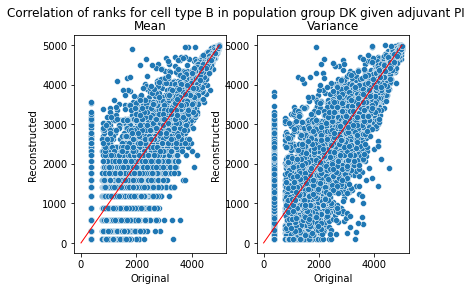

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1
The gene with the highest rank is in true is: MALAT1 and pred: MALAT1
The gene with the highest rank is in true is: MALAT1 and pred: MALAT1
The gene with the highest rank is in true is: MALAT1 and pred: MALAT1
The gene with the highest rank is in true is: MALAT1 and pred: MALAT1
The gene with the highest rank is in true is: MALAT1 and pred: MALAT1
The gene with the highest rank is in true is: MALAT1 and pred: MALAT1
The gene with the highest rank is in true is: MALAT1 and pred: FTH1
The gene with the highest rank is in true is: MALAT1 and pred: MALAT1
The gene with the highest rank is in true is: FTH1 and pred: FTH1
The gene with the highest rank is in true is: MALAT1 and pred: MALAT1
The gene with the highest rank is in true is: MALAT1 and pred: MALAT1
The gene with the highest rank is in true is: MALAT1 and pred: MALAT1
The gene with the highest rank is in true is: MALAT1 and pred: MALAT1
The gene with the highest 

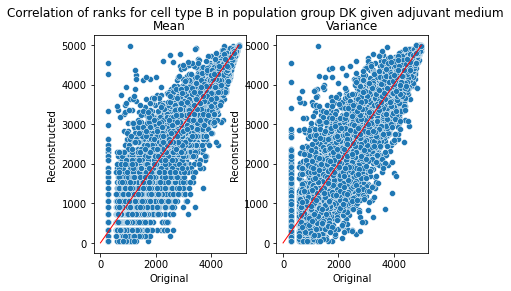

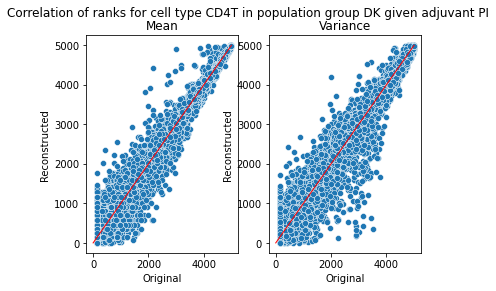

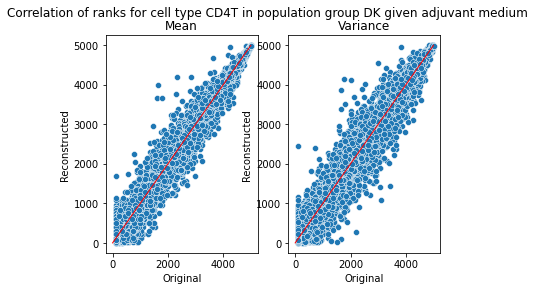

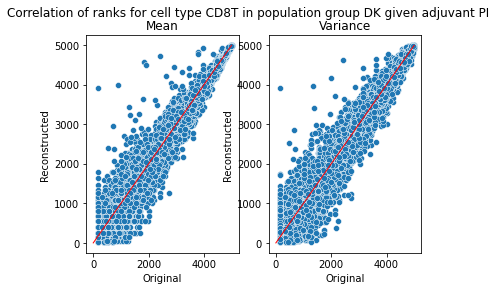

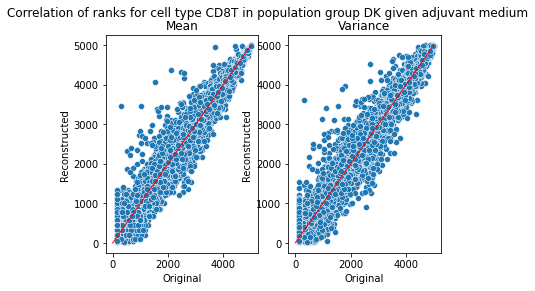

...

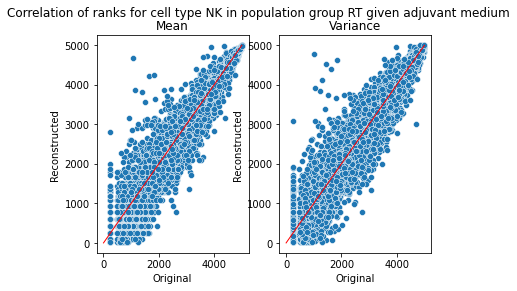

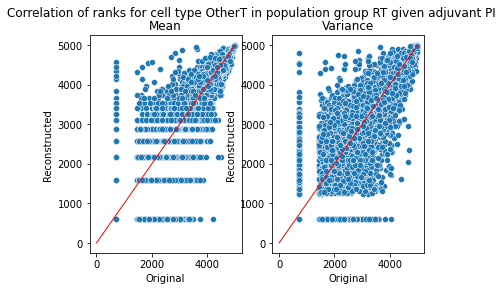

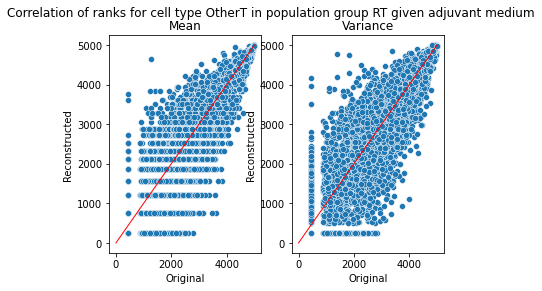

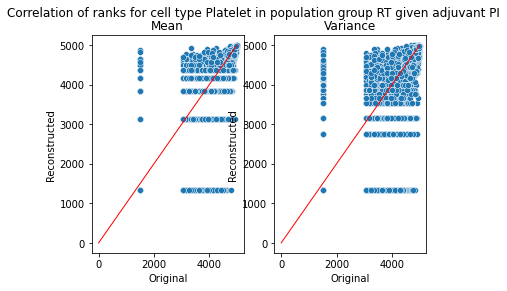

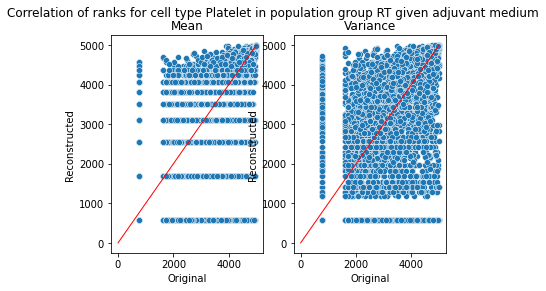

In [10]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    df = evaluate_corr(my_model, sample_dist = "posterior", plot_ranks=True) 


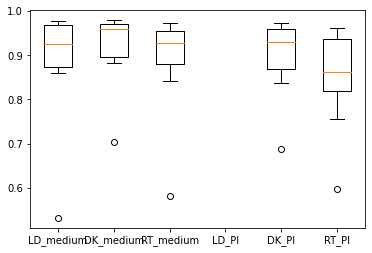

In [6]:
boxplot_corr('../results/csv/{}_{}_{}'.format(my_model.args['model_type'], my_model.args['model_name'], 'posterior'), 
             col_conds, 
             score = "corr_mean")

### Prior sampling

Start running


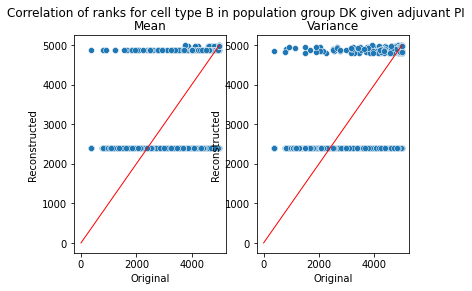

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


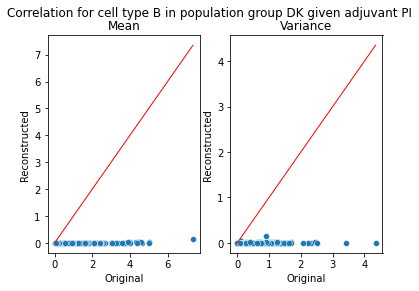

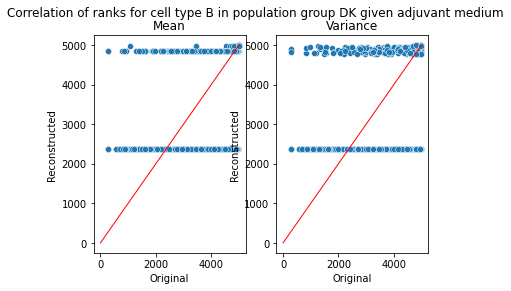

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


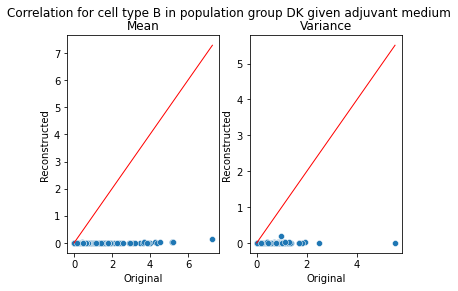

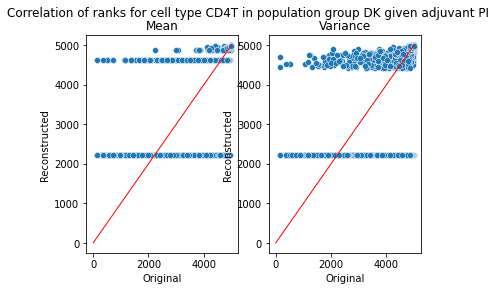

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


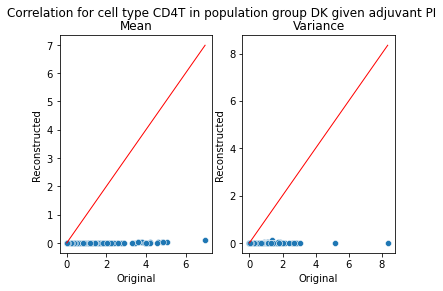

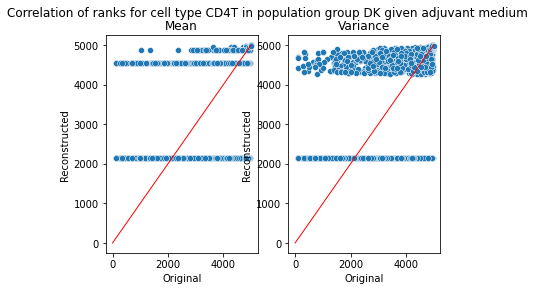

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


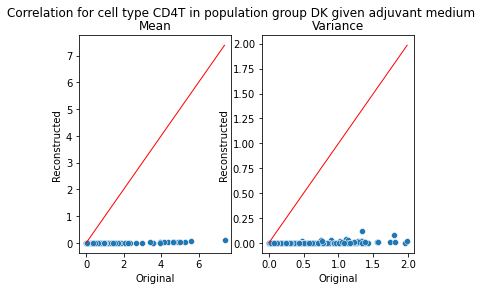

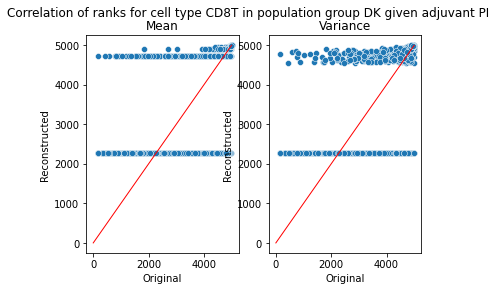

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


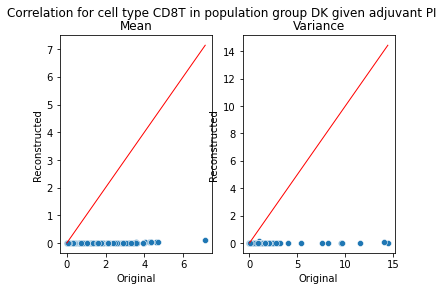

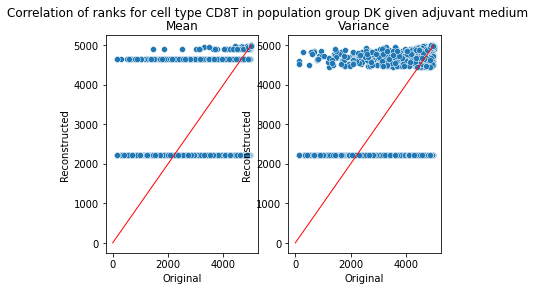

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


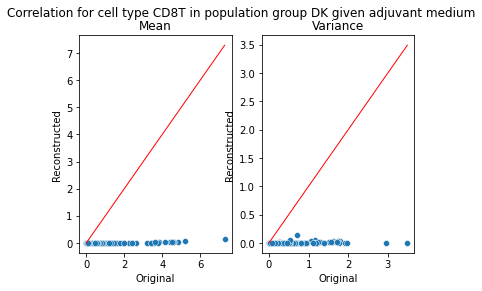

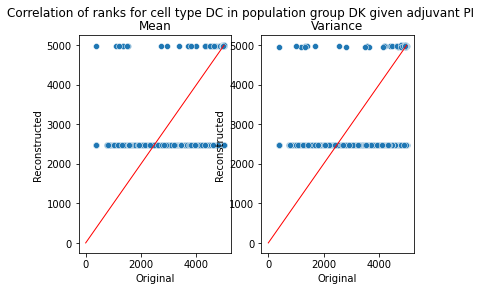

The gene with the highest rank is in true is: MALAT1 and pred: FTH1


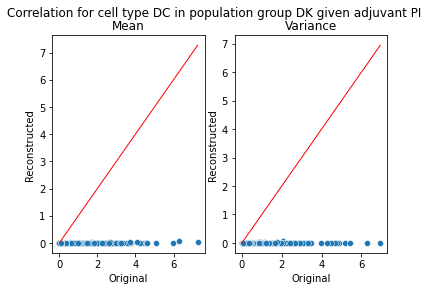

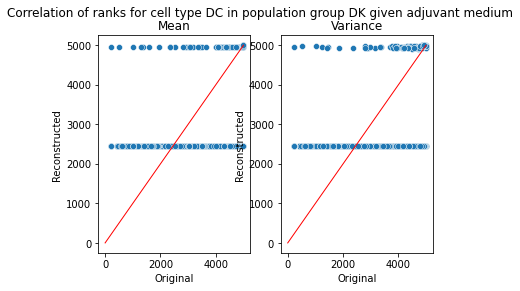

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


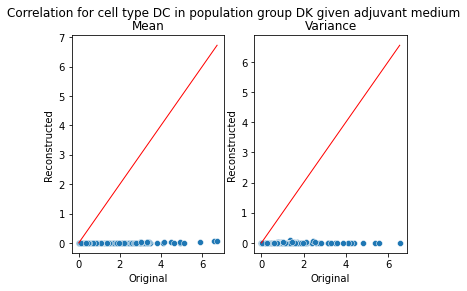

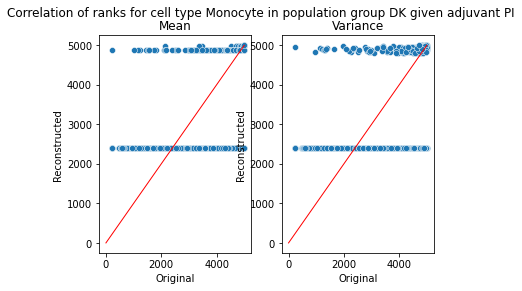

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


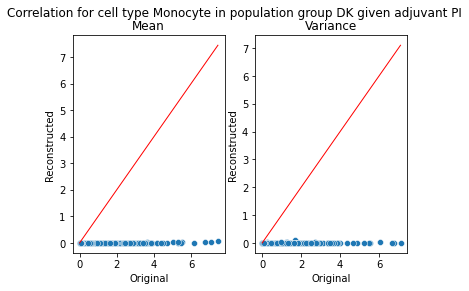

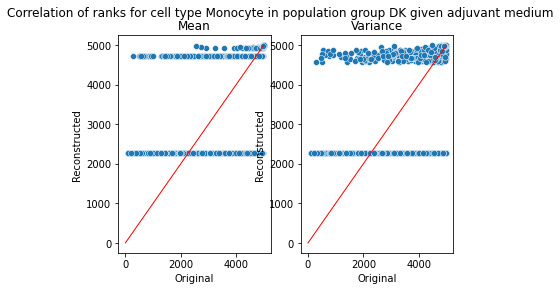

The gene with the highest rank is in true is: FTH1 and pred: FTH1


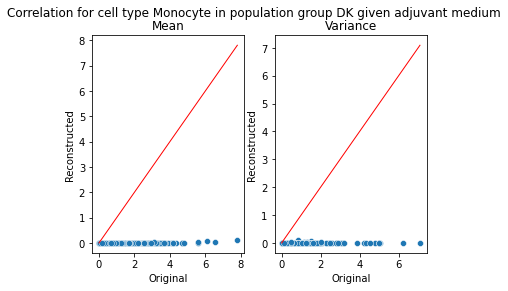

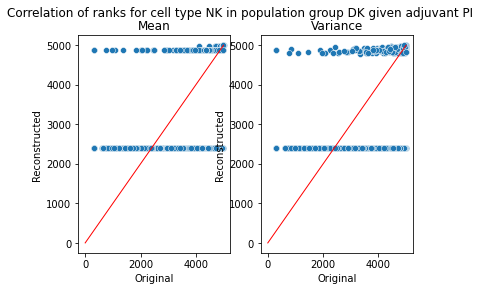

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


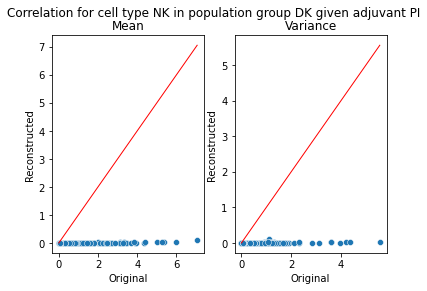

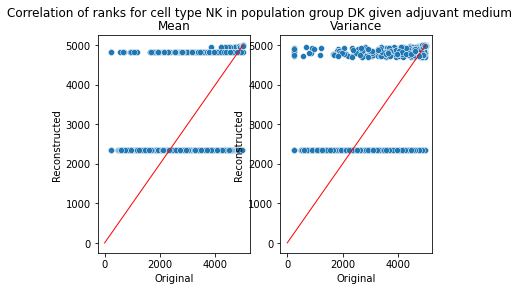

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


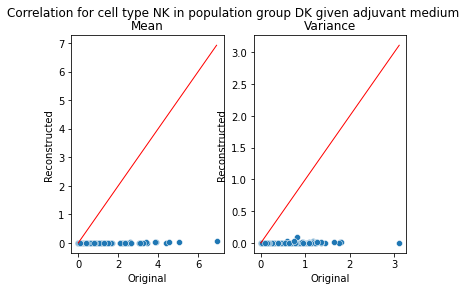

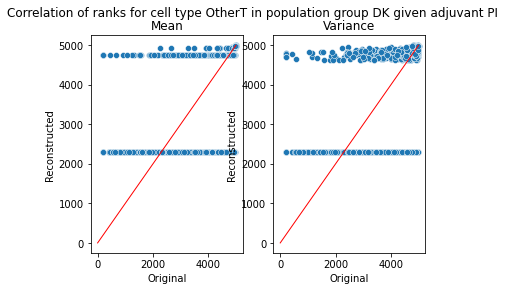

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


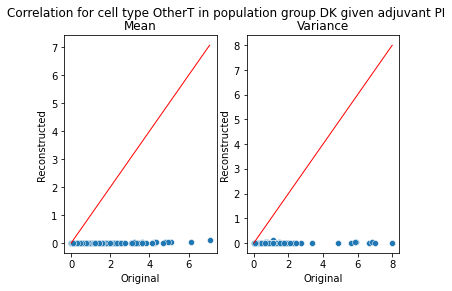

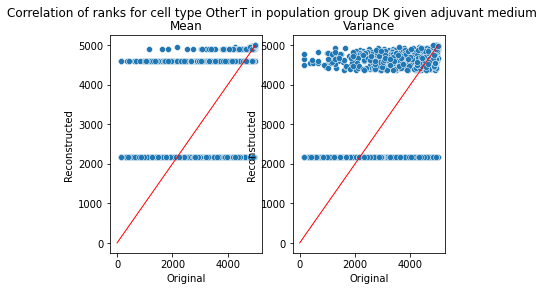

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


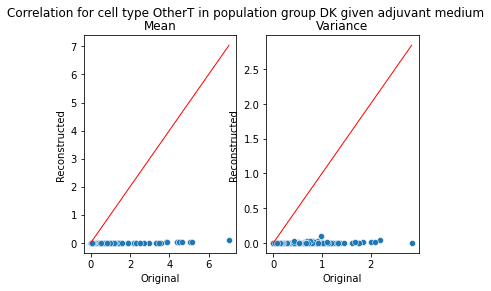

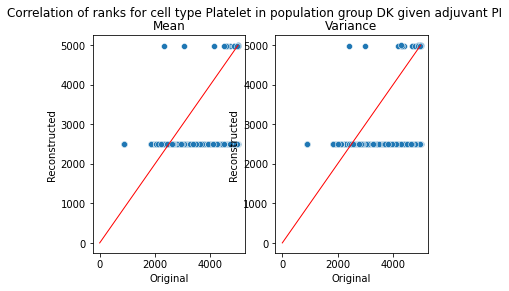

The gene with the highest rank is in true is: MALAT1 and pred: RPL39


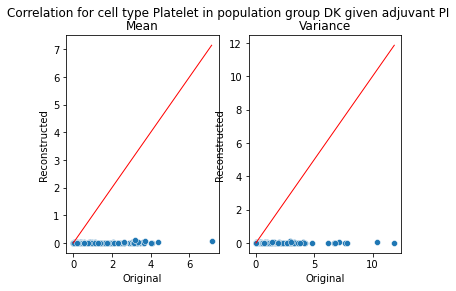

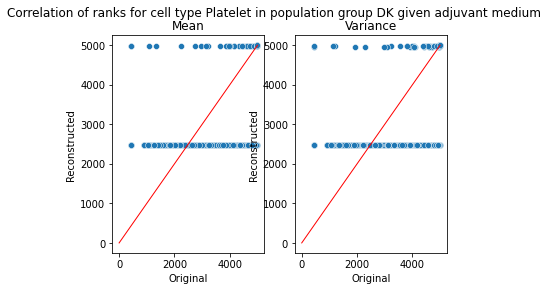

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


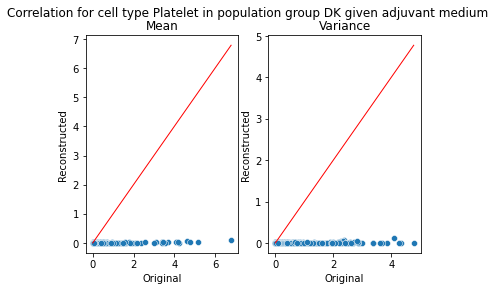

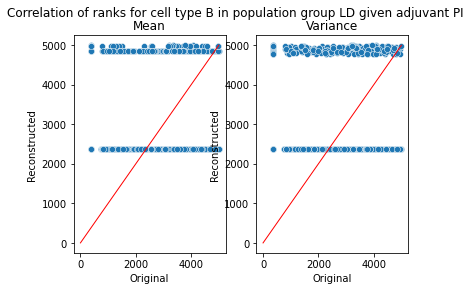

The gene with the highest rank is in true is: MPEG1 and pred: MALAT1


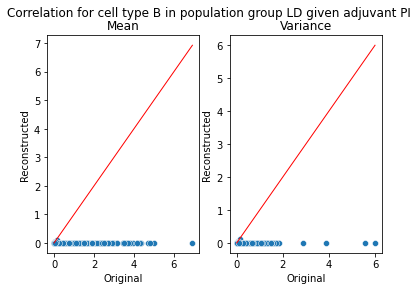

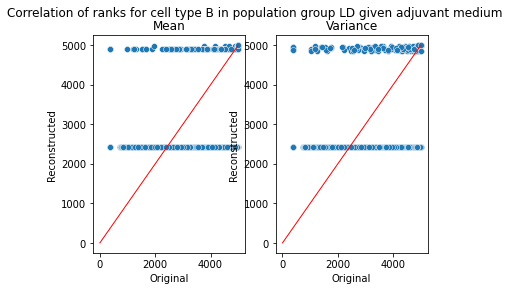

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


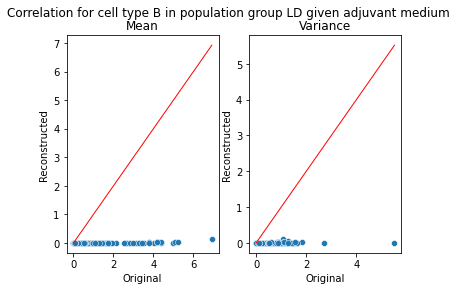

In [ ]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    print("Start running")
    df = evaluate_corr(my_model, sample_dist = "prior", plot_corr=True, plot_ranks = True, eval_hvg=False)  

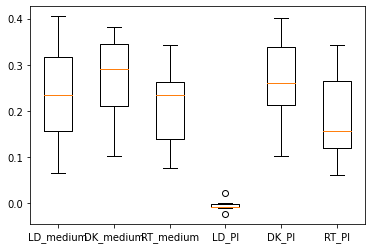

In [5]:
boxplot_corr('../results/csv/{}_{}_{}'.format(my_model.args['model_type'], my_model.args['model_name'], 'prior'), 
             col_conds, 
             score = "corr_mean")

### Transfer sampling

Transfer sampling


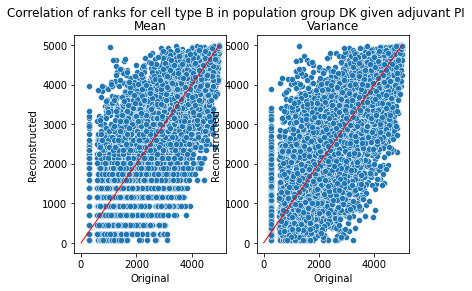

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


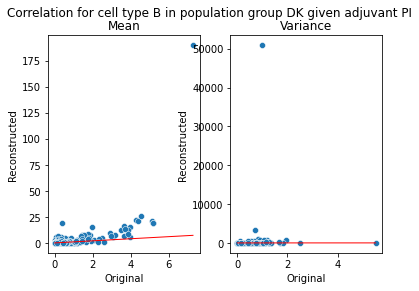

Transfer sampling


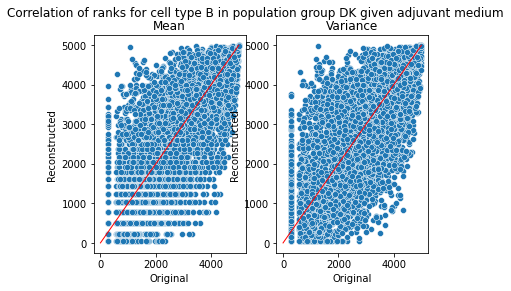

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


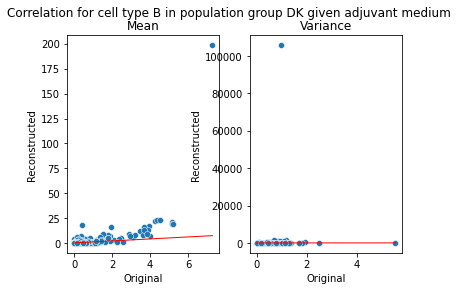

Transfer sampling


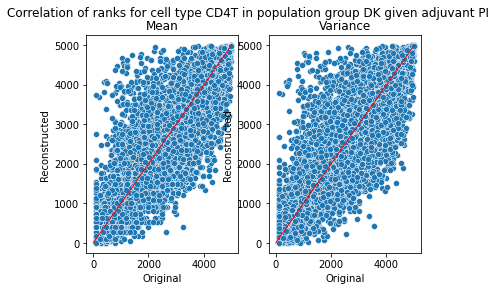

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


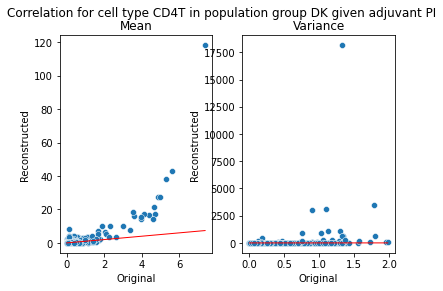

Transfer sampling


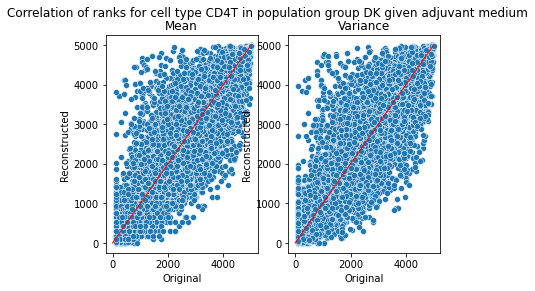

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


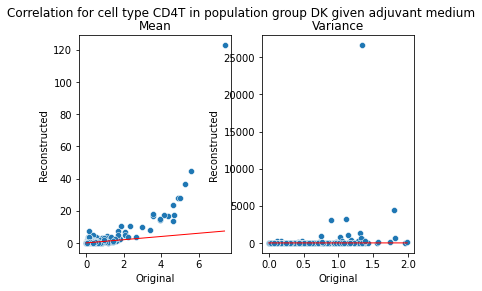

Transfer sampling


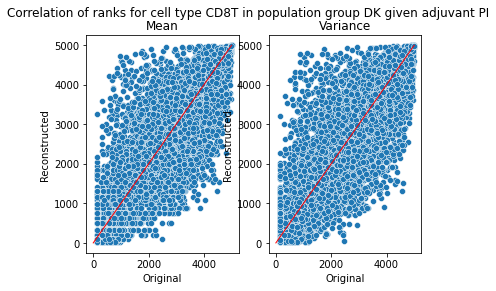

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


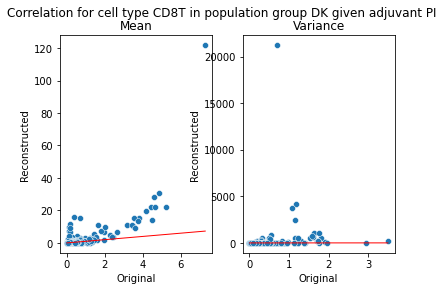

Transfer sampling


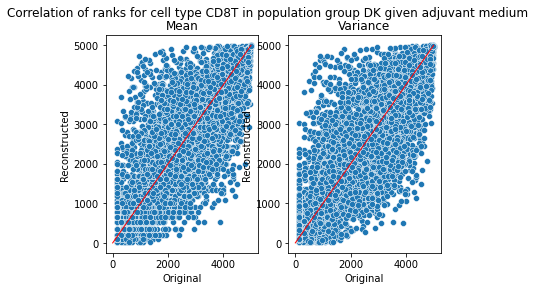

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


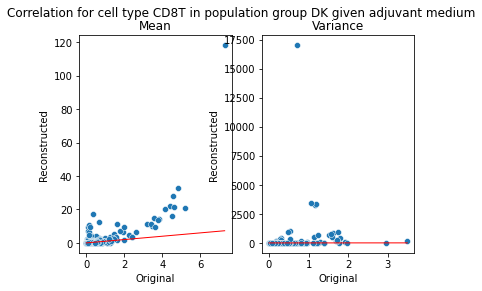

Transfer sampling


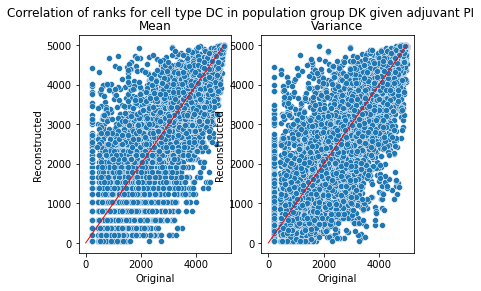

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


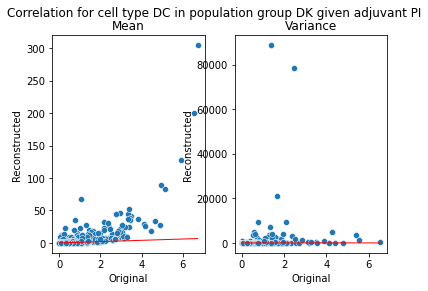

Transfer sampling


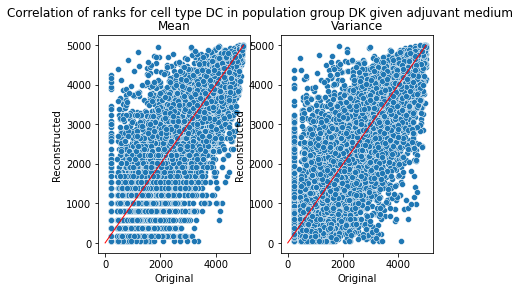

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


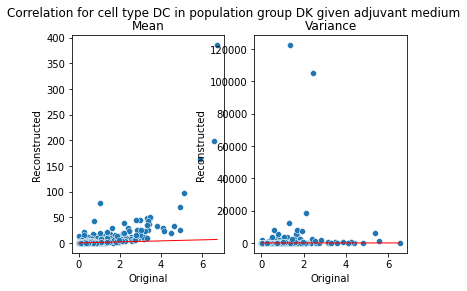

Transfer sampling


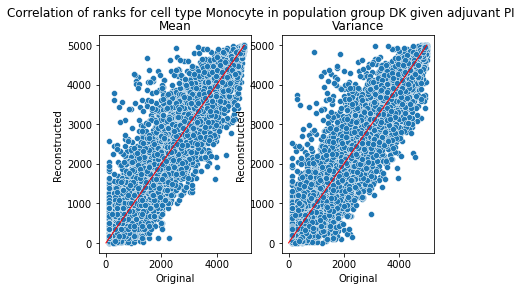

The gene with the highest rank is in true is: FTH1 and pred: MALAT1


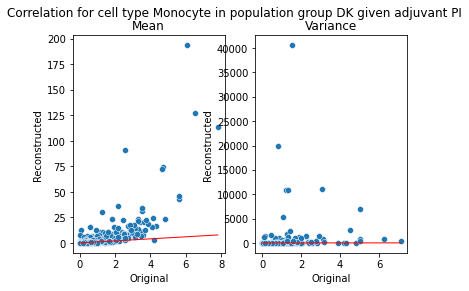

Transfer sampling


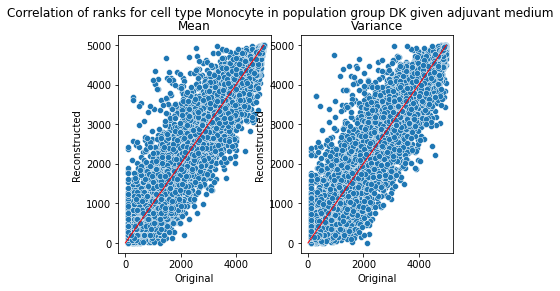

The gene with the highest rank is in true is: FTH1 and pred: MALAT1


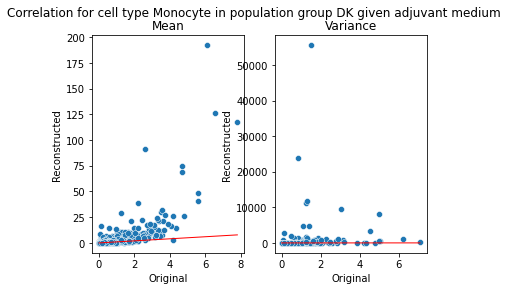

Transfer sampling


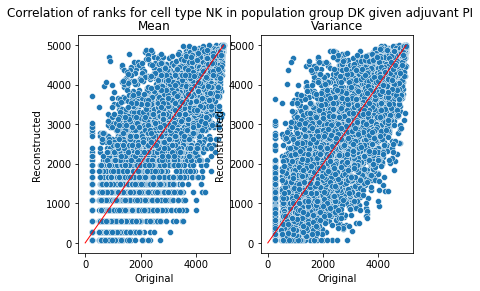

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


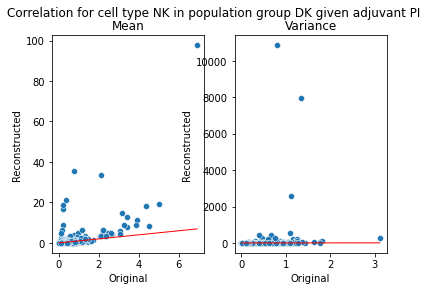

Transfer sampling


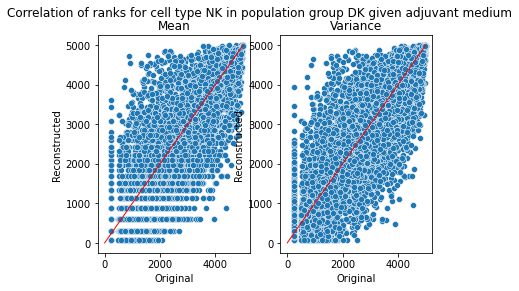

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


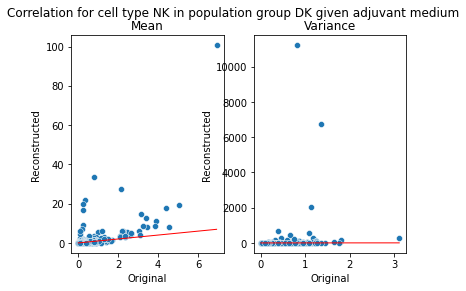

Transfer sampling


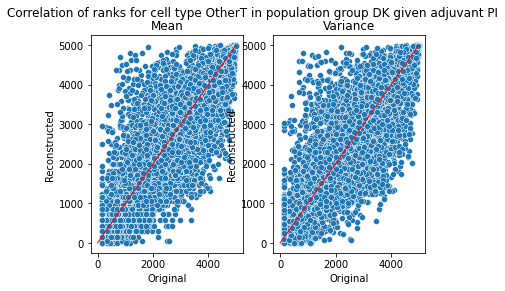

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


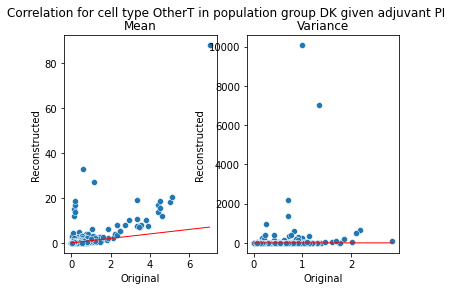

Transfer sampling


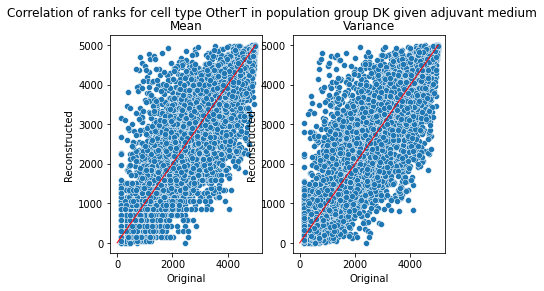

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


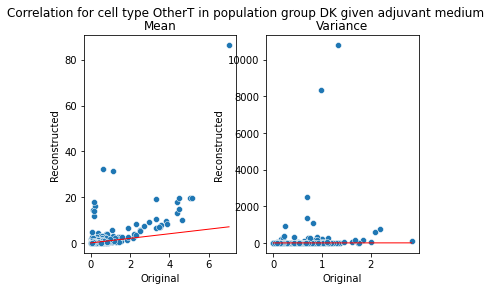

Transfer sampling


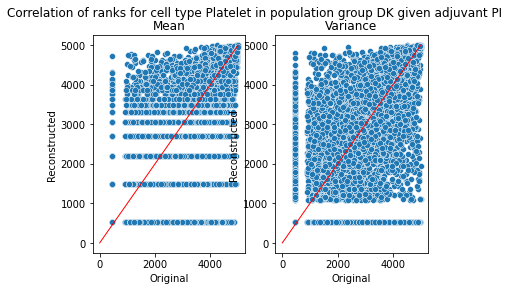

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


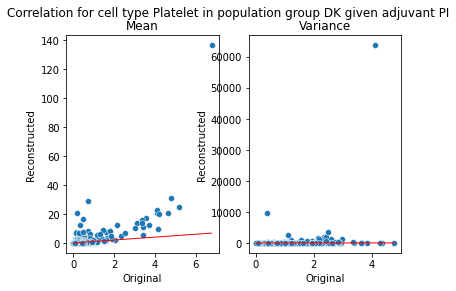

Transfer sampling


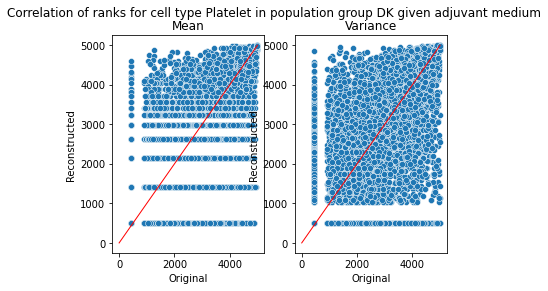

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


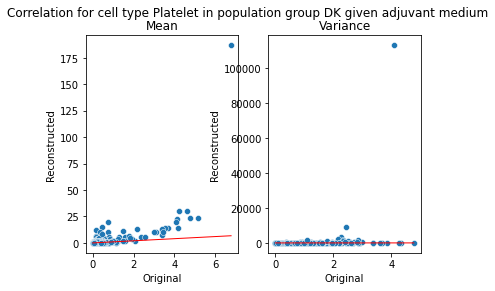

Transfer sampling


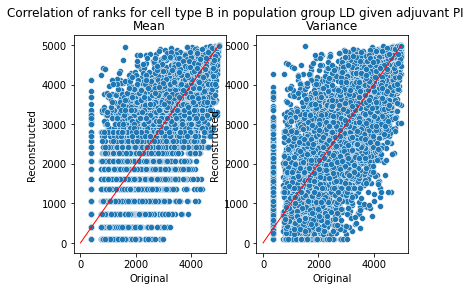

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


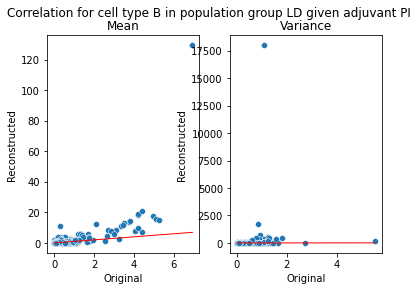

Transfer sampling


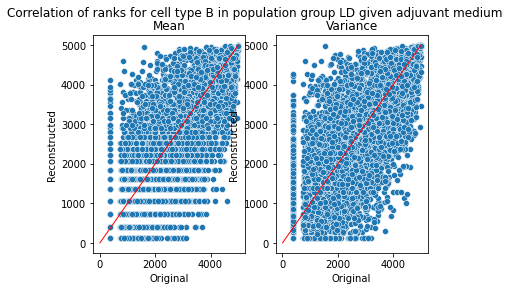

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


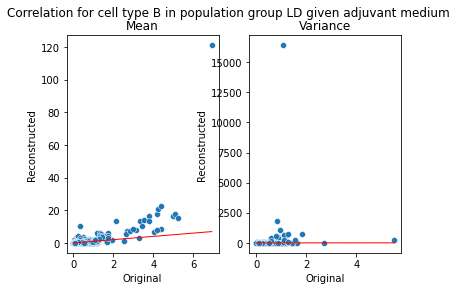

Transfer sampling


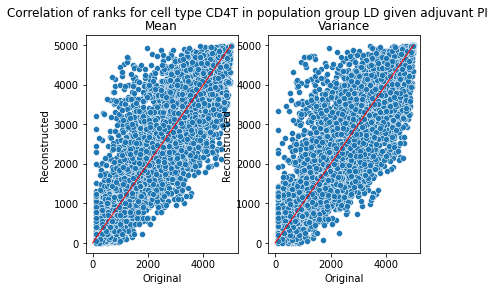

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


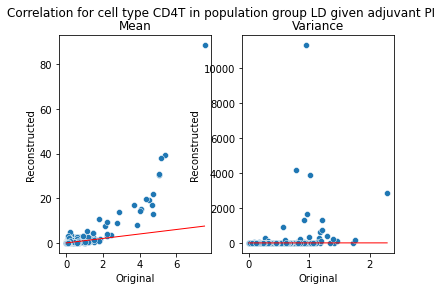

Transfer sampling


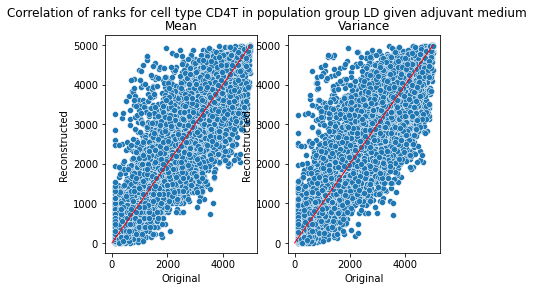

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


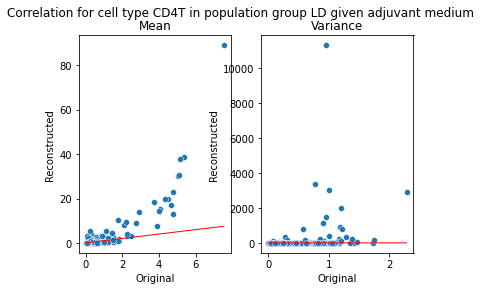

Transfer sampling


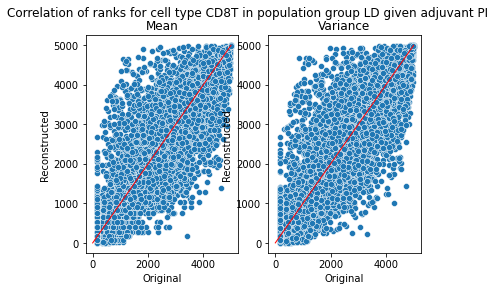

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


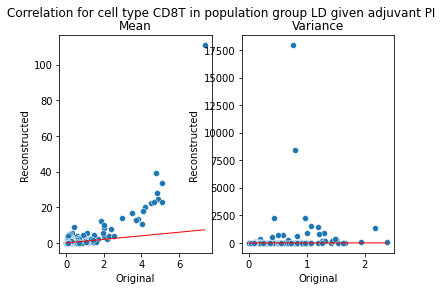

Transfer sampling


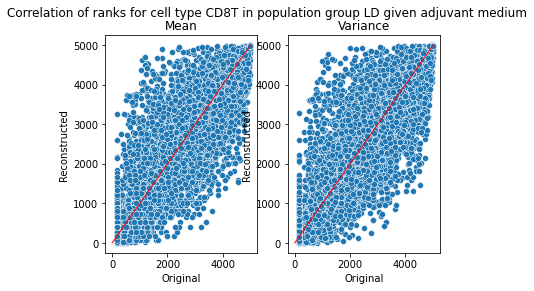

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


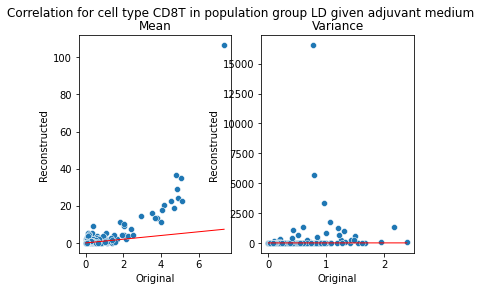

Transfer sampling


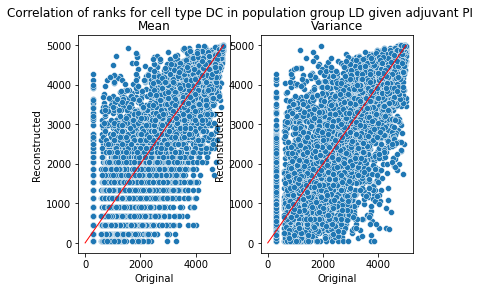

The gene with the highest rank is in true is: FTH1 and pred: MALAT1


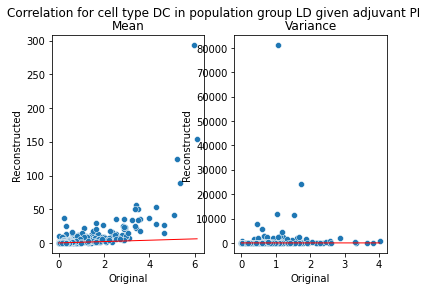

Transfer sampling


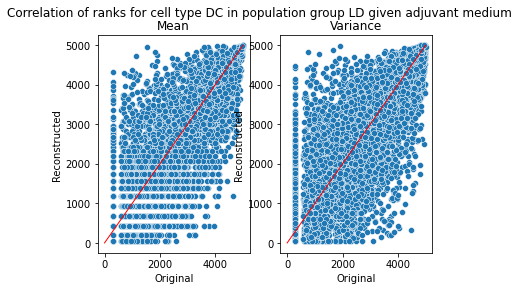

The gene with the highest rank is in true is: FTH1 and pred: MALAT1


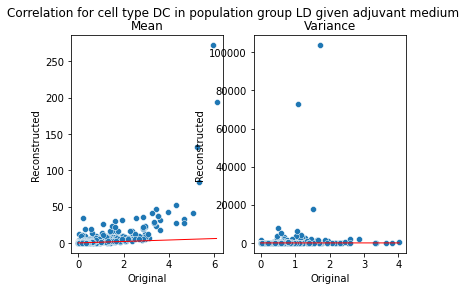

Transfer sampling


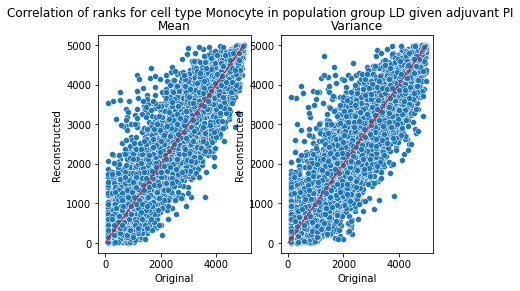

The gene with the highest rank is in true is: FTH1 and pred: MALAT1


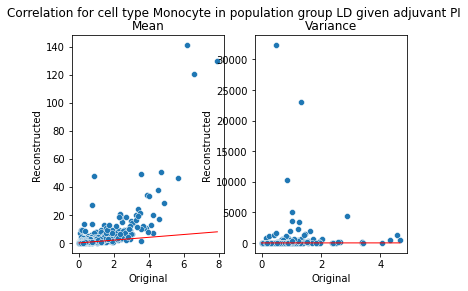

Transfer sampling


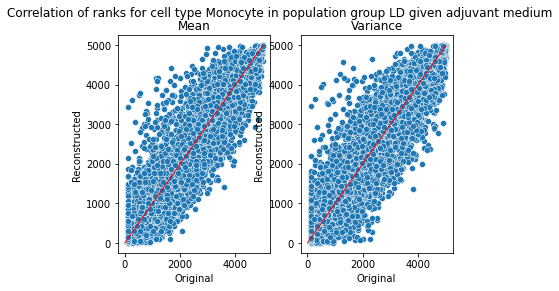

The gene with the highest rank is in true is: FTH1 and pred: MALAT1


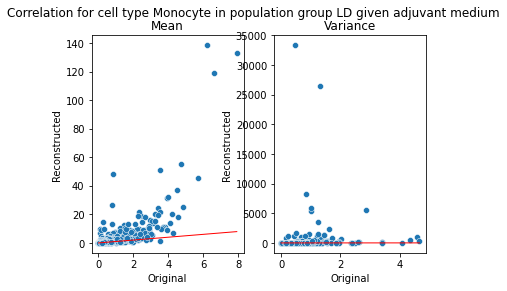

Transfer sampling


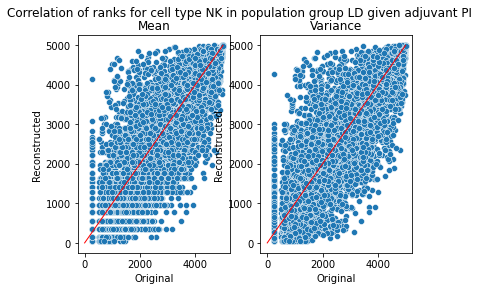

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


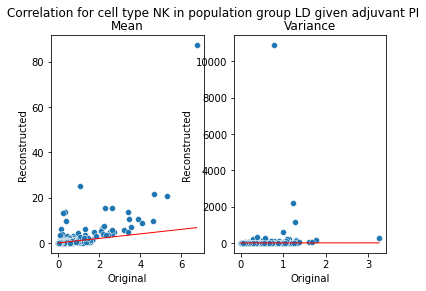

Transfer sampling


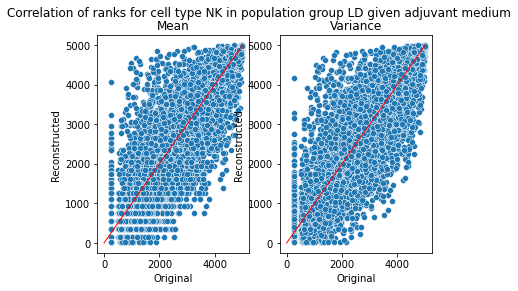

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


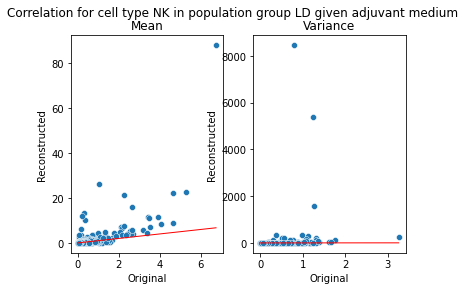

Transfer sampling


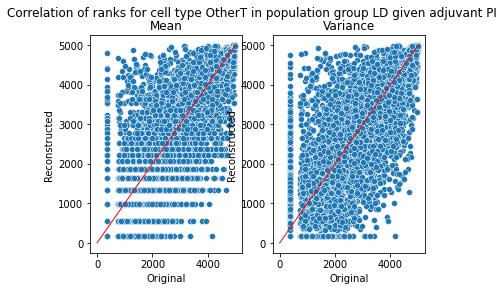

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


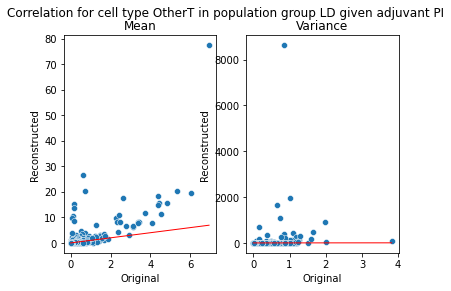

Transfer sampling


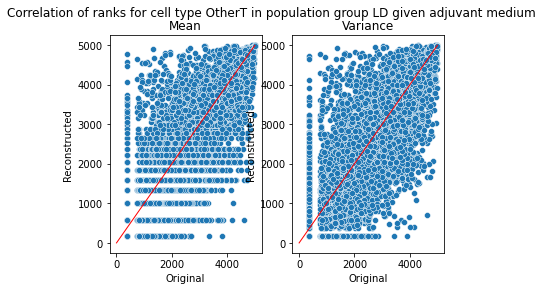

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


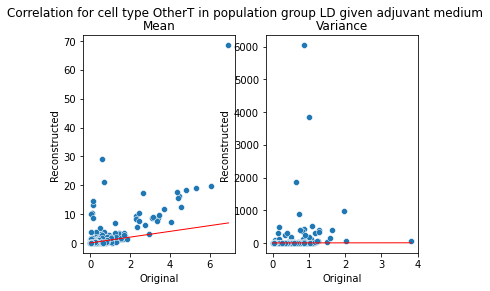

Transfer sampling


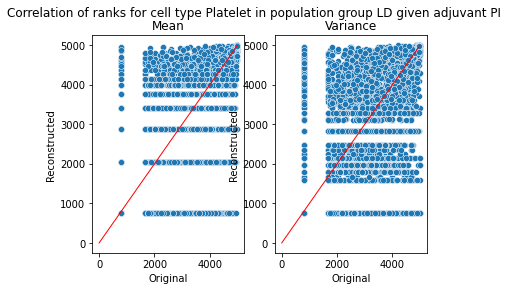

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


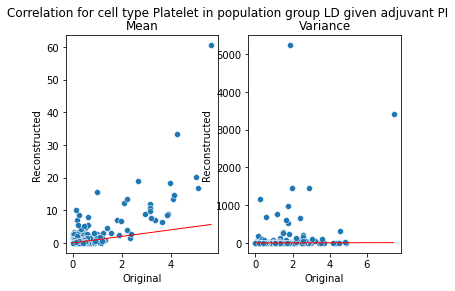

Transfer sampling


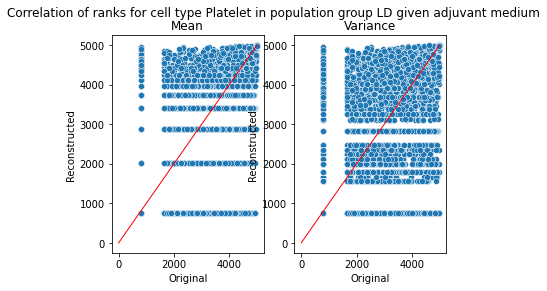

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


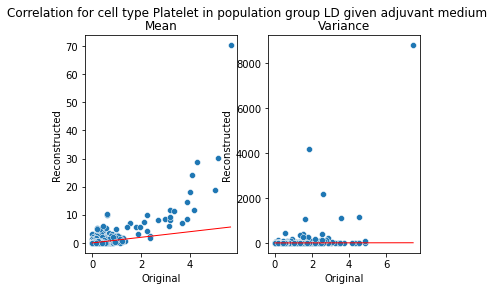

Transfer sampling


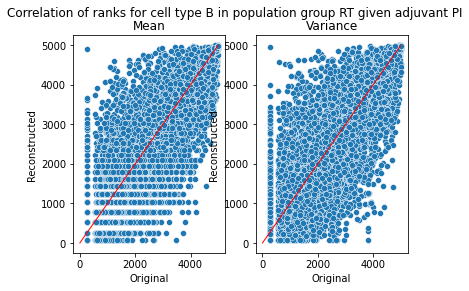

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


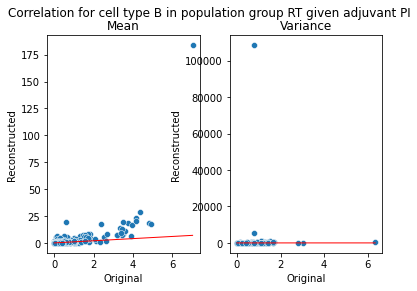

Transfer sampling


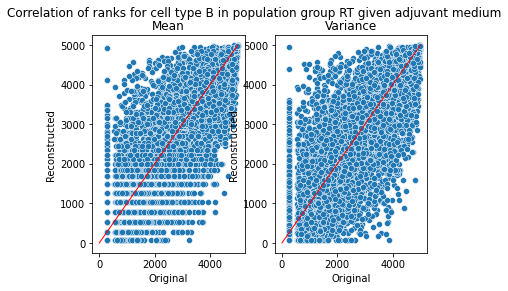

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


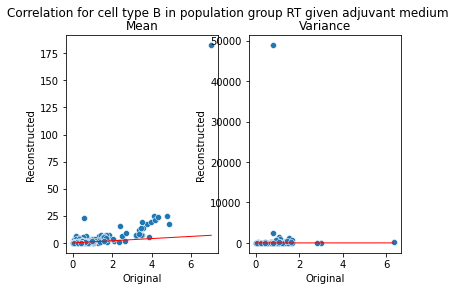

Transfer sampling


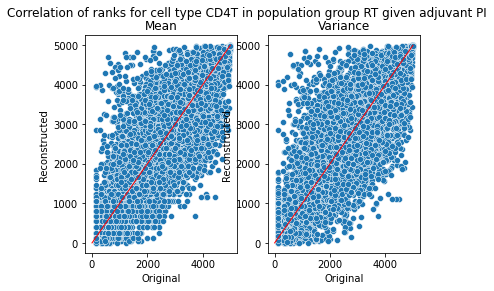

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


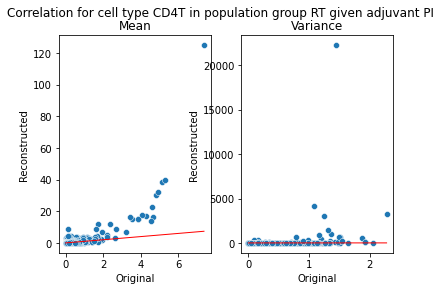

Transfer sampling


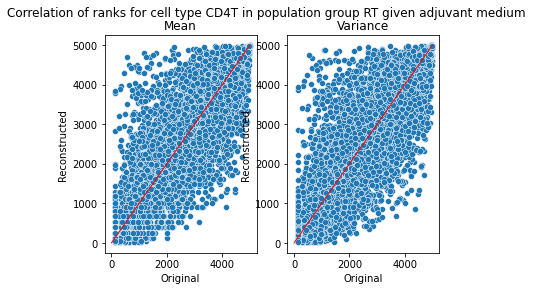

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


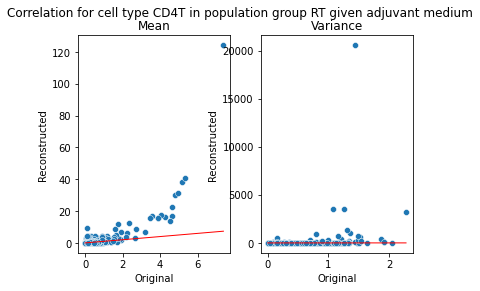

Transfer sampling


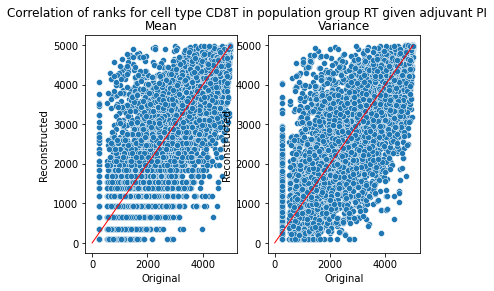

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


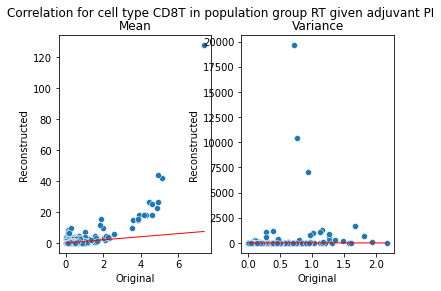

Transfer sampling


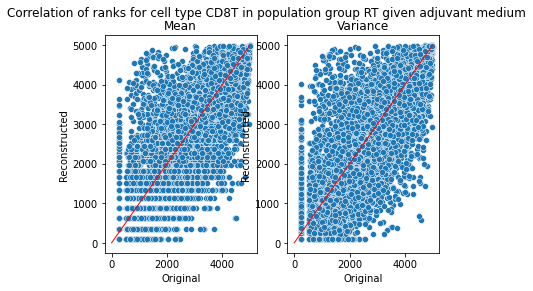

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


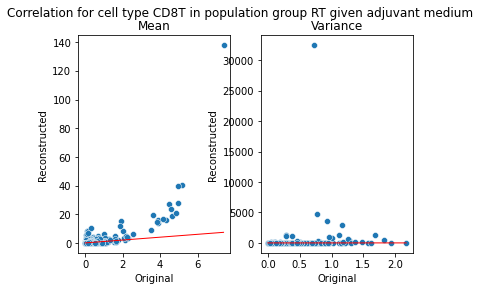

Transfer sampling


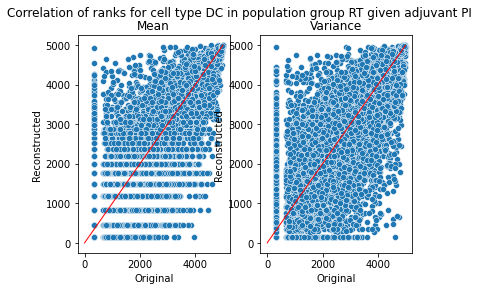

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


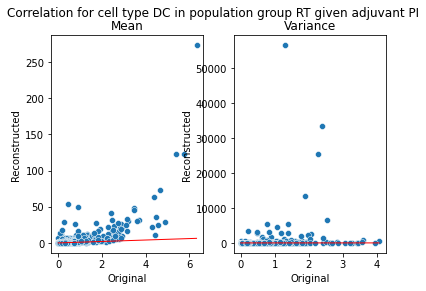

Transfer sampling


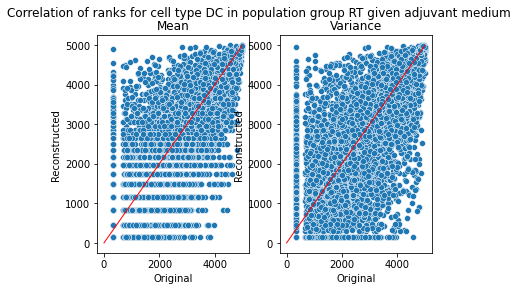

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


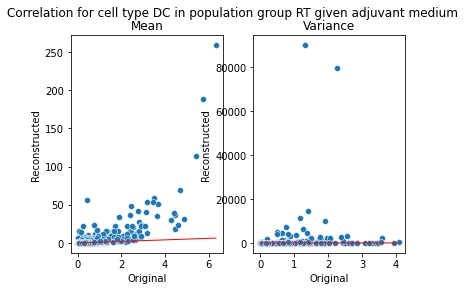

Transfer sampling


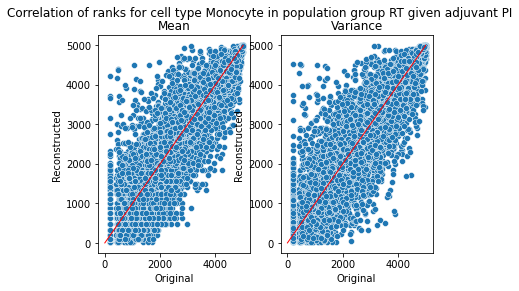

The gene with the highest rank is in true is: FTH1 and pred: MALAT1


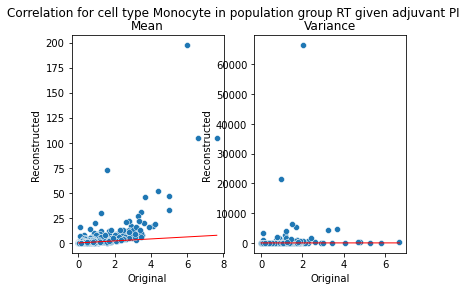

Transfer sampling


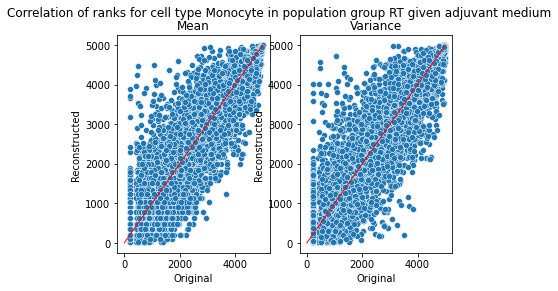

The gene with the highest rank is in true is: FTH1 and pred: MALAT1


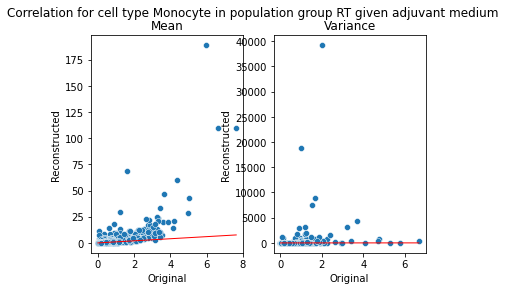

Transfer sampling


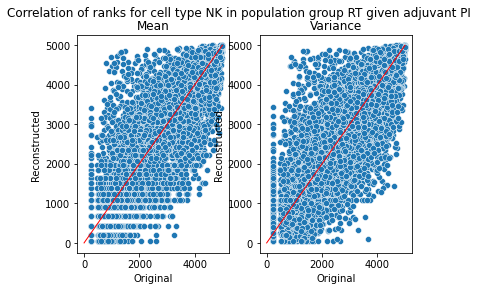

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


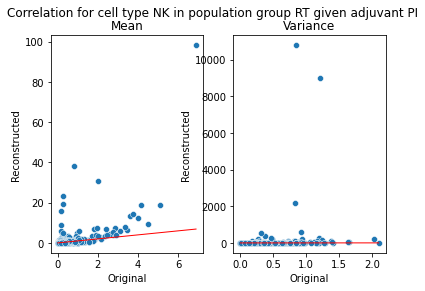

Transfer sampling


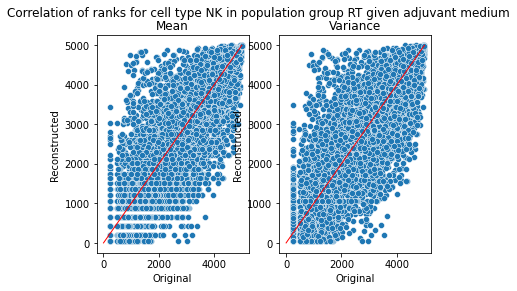

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


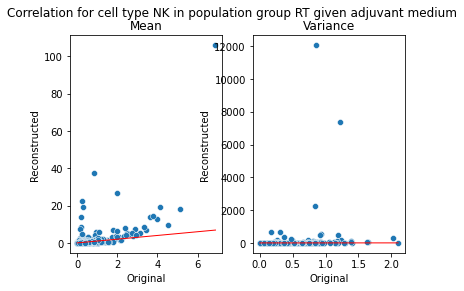

Transfer sampling


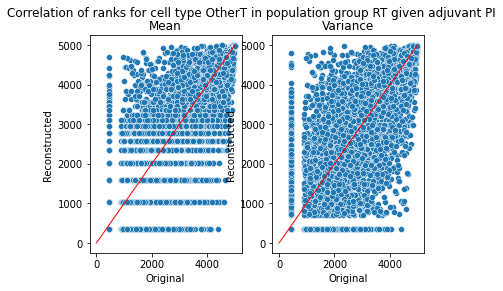

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


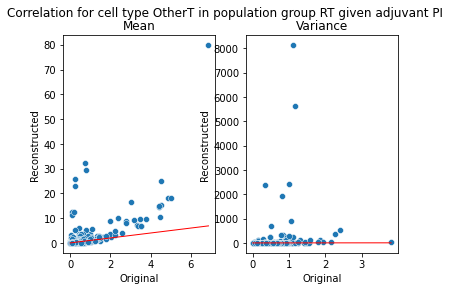

Transfer sampling


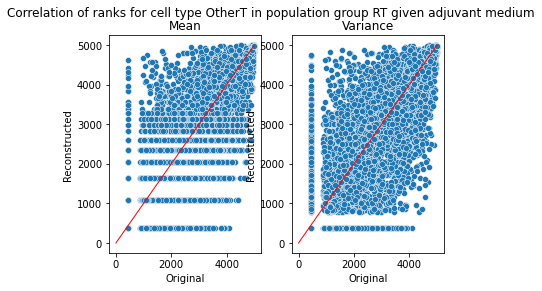

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


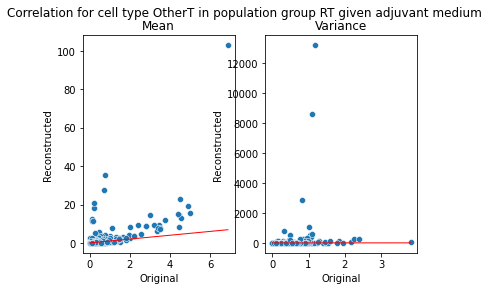

Transfer sampling


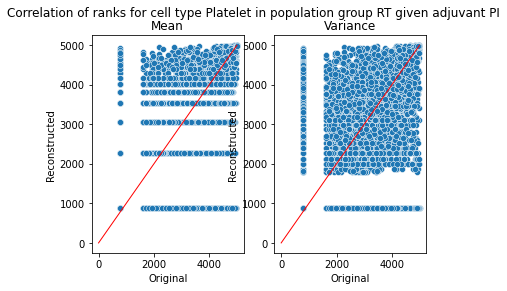

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


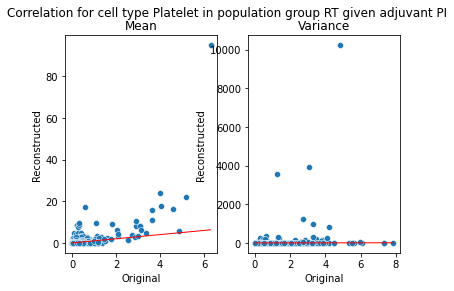

Transfer sampling


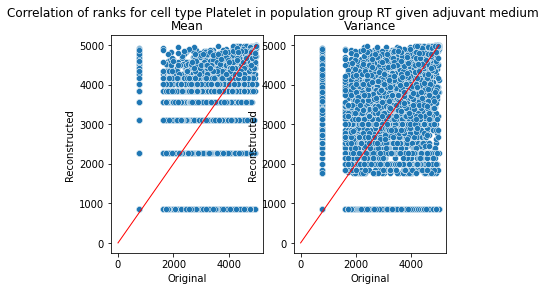

The gene with the highest rank is in true is: MALAT1 and pred: MALAT1


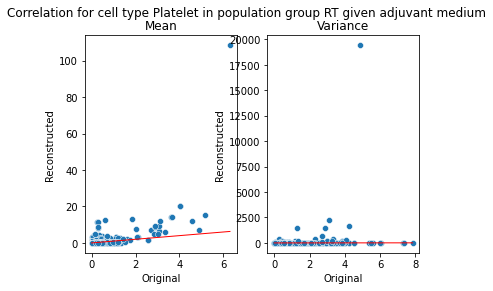

    PG        CT     ADJ  corr_mean  corr_mean_DE  corr_var  corr_var_DE  \
0   DK         B      PI      0.770         0.451     0.760        0.444   
1   DK         B  medium      0.767         0.442     0.757        0.433   
2   DK      CD4T      PI      0.834         0.671     0.825        0.659   
3   DK      CD4T  medium      0.835         0.673     0.827        0.662   
4   DK      CD8T      PI      0.801         0.580     0.797        0.576   
5   DK      CD8T  medium      0.799         0.579     0.795        0.575   
6   DK        DC      PI      0.784         0.544     0.760        0.493   
7   DK        DC  medium      0.784         0.543     0.757        0.492   
8   DK  Monocyte      PI      0.902         0.763     0.898        0.773   
9   DK  Monocyte  medium      0.902         0.762     0.898        0.772   
10  DK        NK      PI      0.813         0.516     0.808        0.518   
11  DK        NK  medium      0.812         0.510     0.808        0.508   
12  DK    Ot

,PG,CT,ADJ,corr_mean,corr_mean_DE,corr_var,corr_var_DE,common_hvg,model,num_cells
0,DK,B,PI,0.770,0.451,0.760,0.444,None,20220521-143044,404
1,DK,B,medium,0.767,0.442,0.757,0.433,None,20220521-143044,404
2,DK,CD4T,PI,0.834,0.671,0.825,0.659,None,20220521-143044,1844
3,DK,CD4T,medium,0.835,0.673,0.827,0.662,None,20220521-143044,1844
4,DK,CD8T,PI,0.801,0.580,0.797,0.576,None,20220521-143044,1333
5,DK,CD8T,medium,0.799,0.579,0.795,0.575,None,20220521-143044,1333
6,DK,DC,PI,0.784,0.544,0.760,0.493,None,20220521-143044,133
7,DK,DC,medium,0.784,0.543,0.757,0.492,None,20220521-143044,133
8,DK,Monocyte,PI,0.902,0.763,0.898,0.773,None,20220521-143044,972
9,DK,Monocyte,medium,0.902,0.762,0.898,0.772,None,20220521-143044,972


In [8]:
evaluate_corr(my_model, sample_dist = "transfer", plot_corr=True, plot_ranks = True)

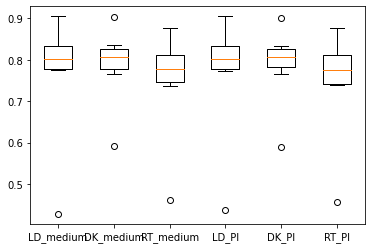

In [10]:
boxplot_corr('../results/csv_2/{}_{}_{}'.format(my_model.args['model_type'], my_model.args['model_name'], 'transfer'), 
             col_conds, 
             score = "corr_mean")
